### 4 Высокочастотная фильтрация

Высокочастотные пространственные фильтры усиливают высокочастотные компоненты
(области с сильным изменением интенсивностей) и ослабляют низкочастотные составляющие изображения.
Используются для выделения перепадов интенсивностей и определения границ (контуров) на изображениях

### 4.1 Фильтр Робертса

In [1]:
import cv2
import skimage
import skimage.filters
import skimage.restoration
import scipy
import scipy.ndimage
import scipy.signal
import numpy as np
from matplotlib import pyplot as plt
from matplotlib.pyplot import figure
from math import *

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


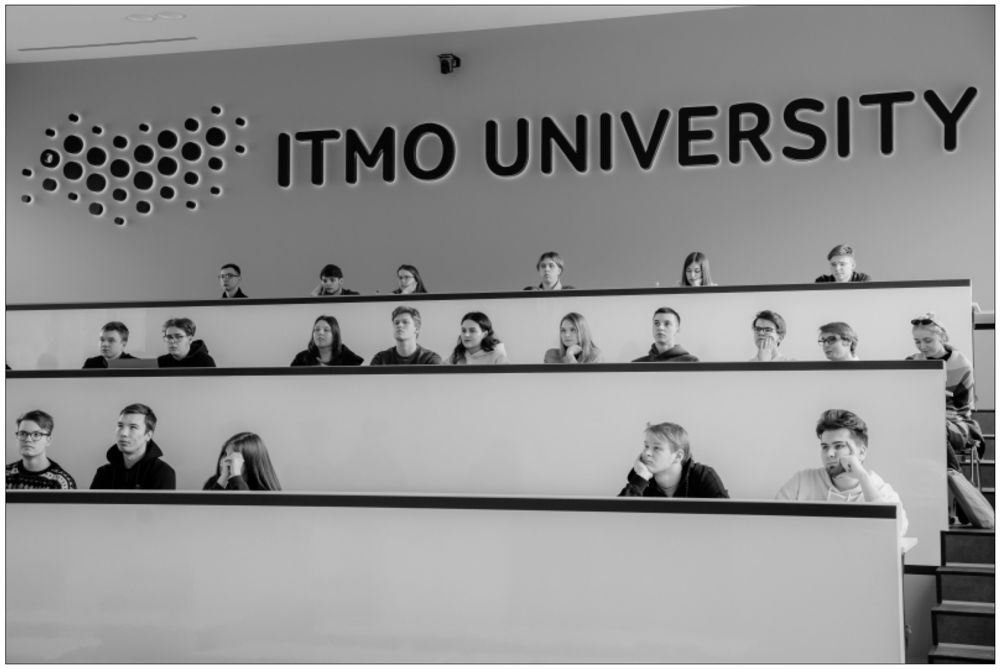

In [3]:
# Новое изображение для обнаружения линий.
image = cv2.cvtColor(cv2.imread('/content/drive/MyDrive/lr3/iitmo.jpg'), cv2.COLOR_BGR2GRAY)

figure(figsize=(32, 16), dpi=80)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_GRAY2RGB))
plt.xticks([]),plt.yticks([])
plt.show()

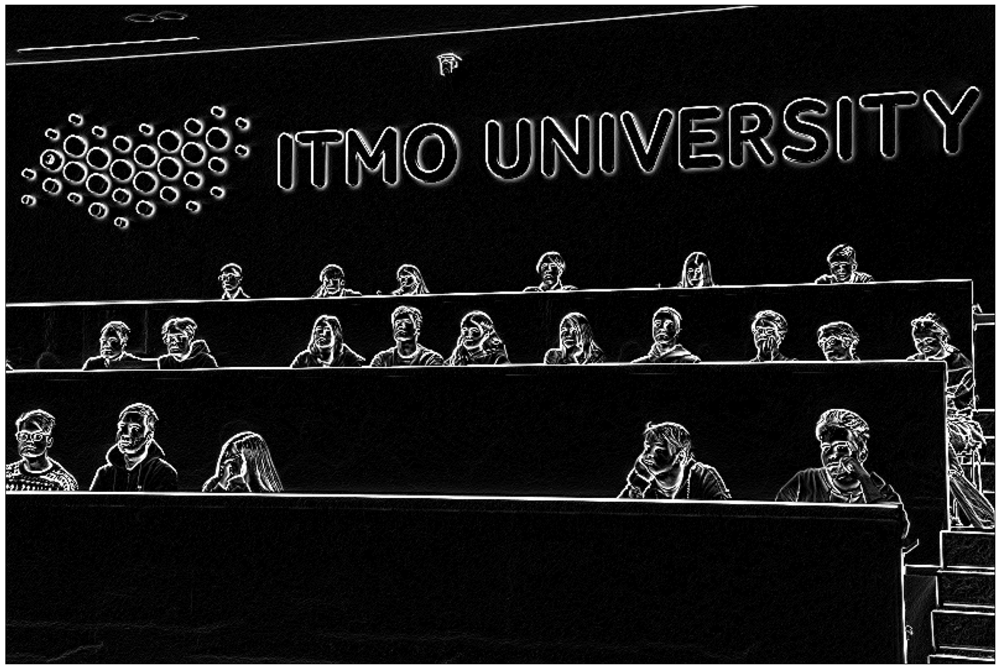

In [4]:
# Оператор Робертса вариант 1
kernel_Roberts_x = np.array([
    [1, -1],
    [0, 0]
    ])
kernel_Roberts_y = np.array([
    [1, 0],
    [-1, 0]
    ])
kernel_Ku = 8.0

image_filtered = kernel_Ku * np.sqrt(
    np.power(cv2.filter2D(image, -1, kernel_Roberts_x), 2.0) + \
    np.power(cv2.filter2D(image, -1, kernel_Roberts_y), 2.0)
)
image_filtered = np.clip(np.round(image_filtered), 0, 255).astype(dtype=np.uint8)


figure(figsize=(32, 16), dpi=80)
plt.imshow(cv2.cvtColor(image_filtered, cv2.COLOR_GRAY2RGB))
plt.xticks([]),plt.yticks([])
plt.show()

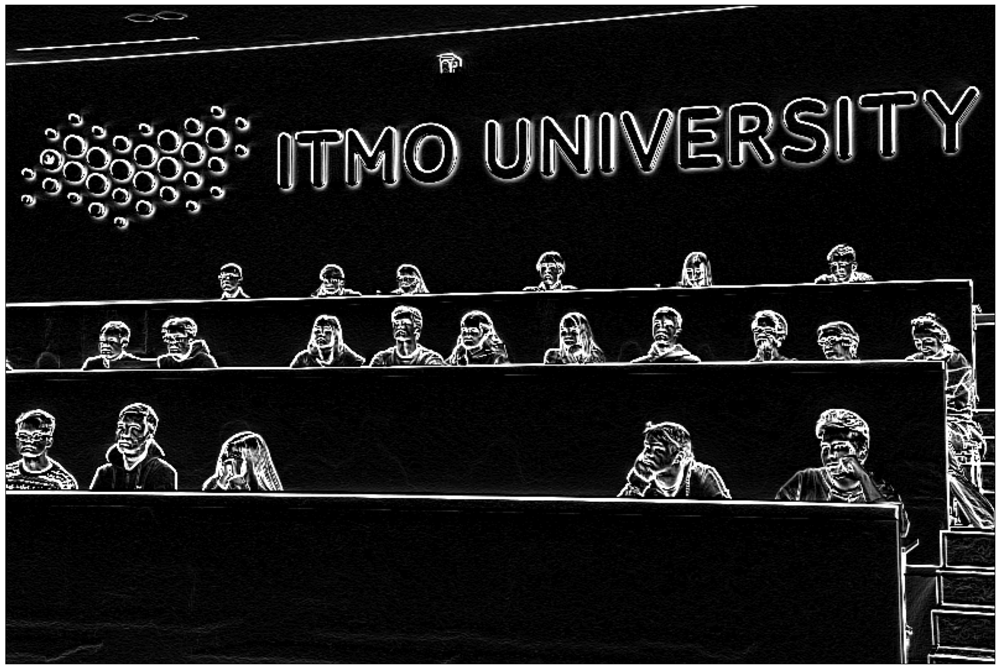

In [5]:
# Оператор Робертса вариант 2
kernel_Roberts_x = np.array([
    [1, 0],
    [0, -1]
    ])
kernel_Roberts_y = np.array([
    [0, 1],
    [-1, 0]
    ])
kernel_Ku = 8.0

image_filtered = kernel_Ku * np.sqrt(
    np.power(cv2.filter2D(image, -1, kernel_Roberts_x), 2.0) + \
    np.power(cv2.filter2D(image, -1, kernel_Roberts_y), 2.0)
)
image_filtered = np.clip(np.round(image_filtered), 0, 255).astype(dtype=np.uint8)


figure(figsize=(32, 16), dpi=80)
plt.imshow(cv2.cvtColor(image_filtered, cv2.COLOR_GRAY2RGB))
plt.xticks([]),plt.yticks([])
plt.show()

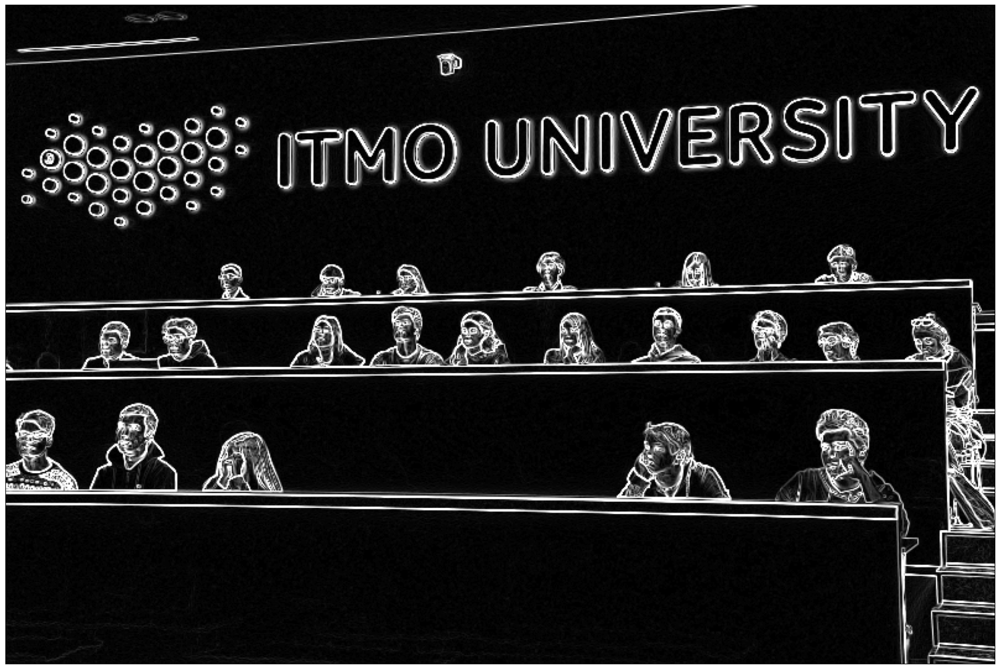

In [6]:
# Оператор Робертса вариант 3
kernel_Roberts_x = np.array([
    [1, 0],
    [0, -1]
    ])
kernel_Roberts_y = np.array([
    [0, 1],
    [-1, 0]
    ])
kernel_Ku = 4.0

image_filtered = kernel_Ku * np.sqrt(
    np.power(cv2.filter2D(image, -1, kernel_Roberts_x), 2.0) + \
    np.power(cv2.filter2D(image, -1, kernel_Roberts_y), 2.0) + \
    np.power(cv2.filter2D(image, -1, -kernel_Roberts_x), 2.0) + \
    np.power(cv2.filter2D(image, -1, -kernel_Roberts_y), 2.0)
)
image_filtered = np.clip(np.round(image_filtered), 0, 255).astype(dtype=np.uint8)

figure(figsize=(32, 16), dpi=80)
plt.imshow(cv2.cvtColor(image_filtered, cv2.COLOR_GRAY2RGB))
plt.xticks([]),plt.yticks([])
plt.show()

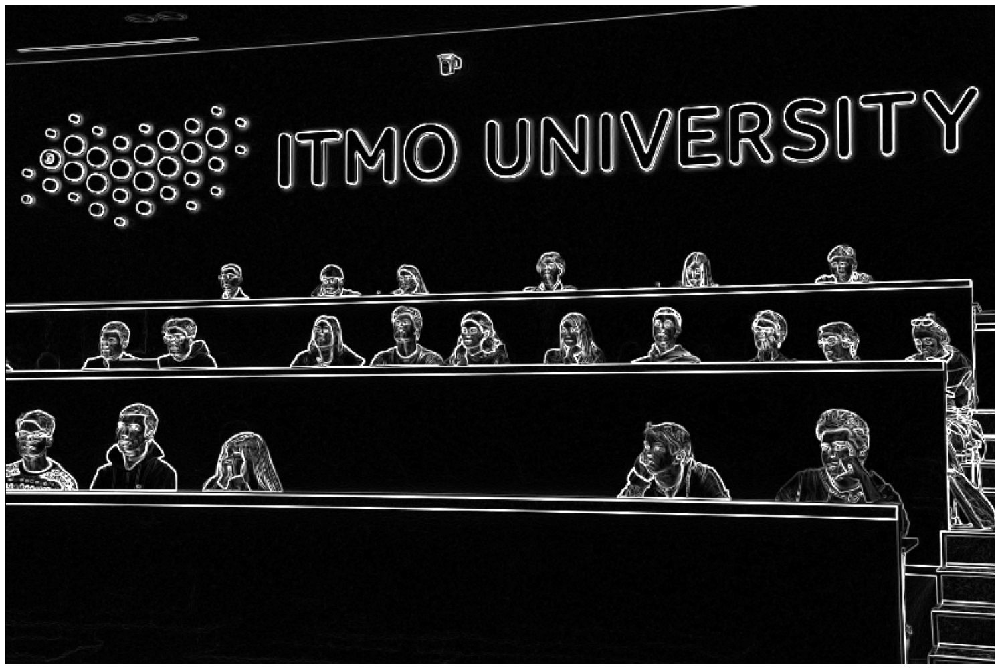

In [7]:
# Оператор Робертса вариант 4
kernel_Roberts_x = np.array([
    [1, 0],
    [0, -1]
    ])
kernel_Roberts_y = np.array([
    [0, 1],
    [-1, 0]
    ])
kernel_Roberts2_x = np.array([
    [1, 0],
    [0, -1]
    ])
kernel_Roberts2_y = np.array([
    [0, 1],
    [-1, 0]
    ])
kernel_Ku = 2.0

image_filtered = kernel_Ku * np.sqrt(
    np.power(cv2.filter2D(image, -1, kernel_Roberts_x), 2.0) + \
    np.power(cv2.filter2D(image, -1, kernel_Roberts_y), 2.0) + \
    np.power(cv2.filter2D(image, -1, -kernel_Roberts_x), 2.0) + \
    np.power(cv2.filter2D(image, -1, -kernel_Roberts_y), 2.0) + \
    np.power(cv2.filter2D(image, -1, kernel_Roberts2_x), 2.0) + \
    np.power(cv2.filter2D(image, -1, kernel_Roberts2_y), 2.0) + \
    np.power(cv2.filter2D(image, -1, -kernel_Roberts2_x), 2.0) + \
    np.power(cv2.filter2D(image, -1, -kernel_Roberts2_y), 2.0)
)
image_filtered = np.clip(np.round(image_filtered), 0, 255).astype(dtype=np.uint8)

figure(figsize=(32, 16), dpi=80)
plt.imshow(cv2.cvtColor(image_filtered, cv2.COLOR_GRAY2RGB))
plt.xticks([]),plt.yticks([])
plt.show()

### 4.2 Фильтр Превитта

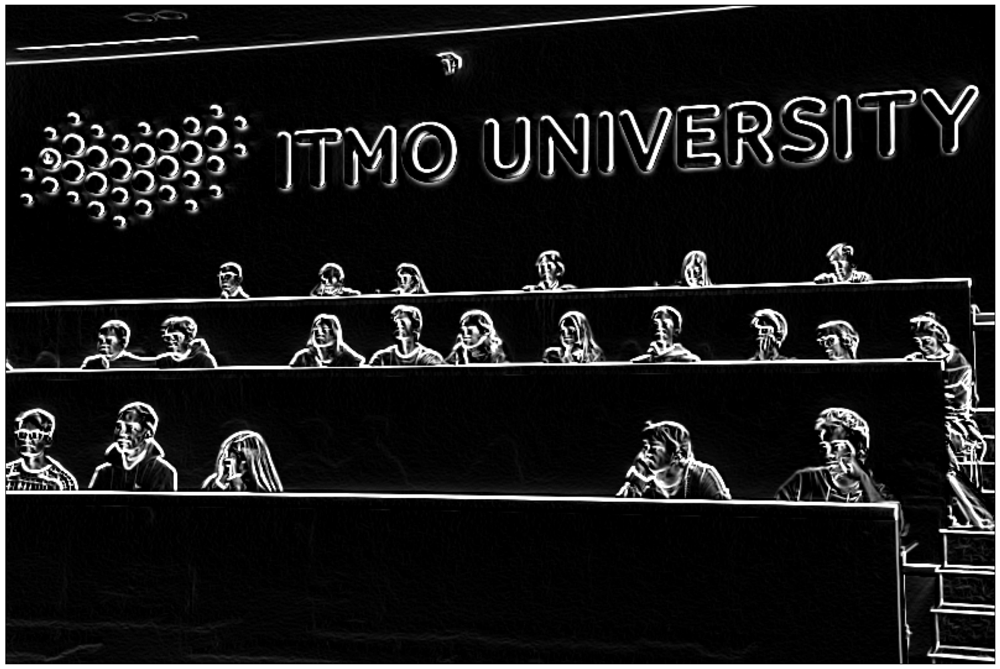

In [8]:
# Оператор Превитта
kernel_Prewitt_x = np.array([
    [-1, 0, 1],
    [-1, 0, 1],
    [-1, 0, 1]])
kernel_Prewitt_y = np.array([
    [1, 1, 1],
    [0, 0, 0],
    [-1, -1, -1]])
kernel_Ku = 2.0

image_filtered = kernel_Ku * np.sqrt(
    np.power(cv2.filter2D(image, -1, kernel_Prewitt_x), 2.0) + \
    np.power(cv2.filter2D(image, -1, kernel_Prewitt_y), 2.0)
)
image_filtered = np.clip(np.round(image_filtered), 0, 255).astype(dtype=np.uint8)

figure(figsize=(32, 16), dpi=80)
plt.imshow(cv2.cvtColor(image_filtered, cv2.COLOR_GRAY2RGB))
plt.xticks([]),plt.yticks([])
plt.show()

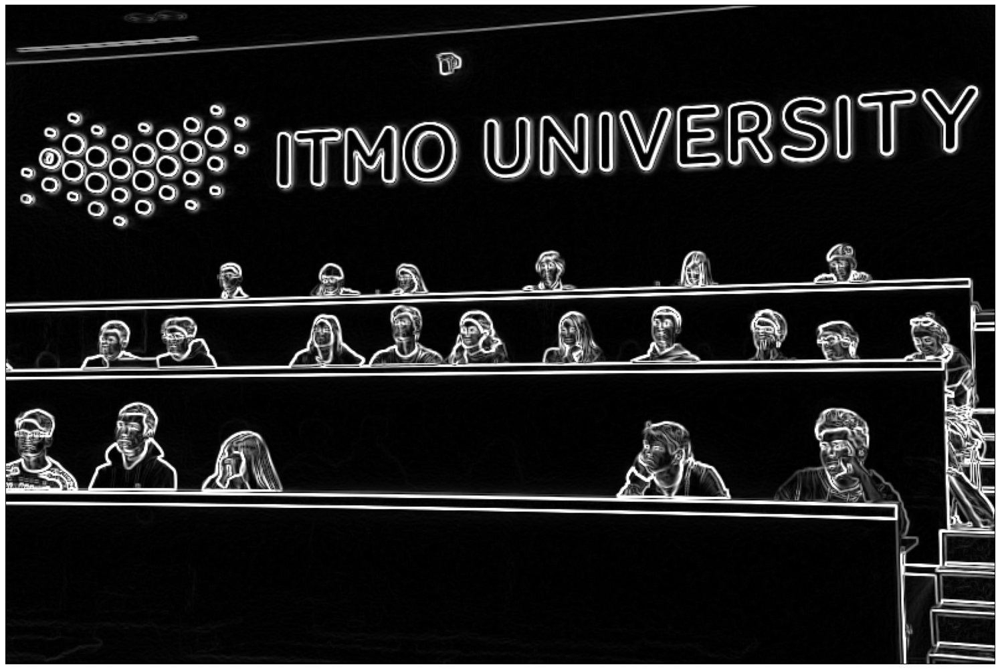

In [9]:
# Оператор Превитта двунаправленный
kernel_Prewitt_x = np.array([
    [-1, 0, 1],
    [-1, 0, 1],
    [-1, 0, 1]])
kernel_Prewitt_y = np.array([
    [1, 1, 1],
    [0, 0, 0],
    [-1, -1, -1]])
kernel_Ku = 1.0

image_filtered = kernel_Ku * np.sqrt(
    np.power(cv2.filter2D(image, -1, kernel_Prewitt_x), 2.0) + \
    np.power(cv2.filter2D(image, -1, kernel_Prewitt_y), 2.0) + \
    np.power(cv2.filter2D(image, -1, -kernel_Prewitt_x), 2.0) + \
    np.power(cv2.filter2D(image, -1, -kernel_Prewitt_y), 2.0)
)
image_filtered = np.clip(np.round(image_filtered), 0, 255).astype(dtype=np.uint8)

figure(figsize=(32, 16), dpi=80)
plt.imshow(cv2.cvtColor(image_filtered, cv2.COLOR_GRAY2RGB))
plt.xticks([]),plt.yticks([])
plt.show()

### 4.3 Фильтр Собела

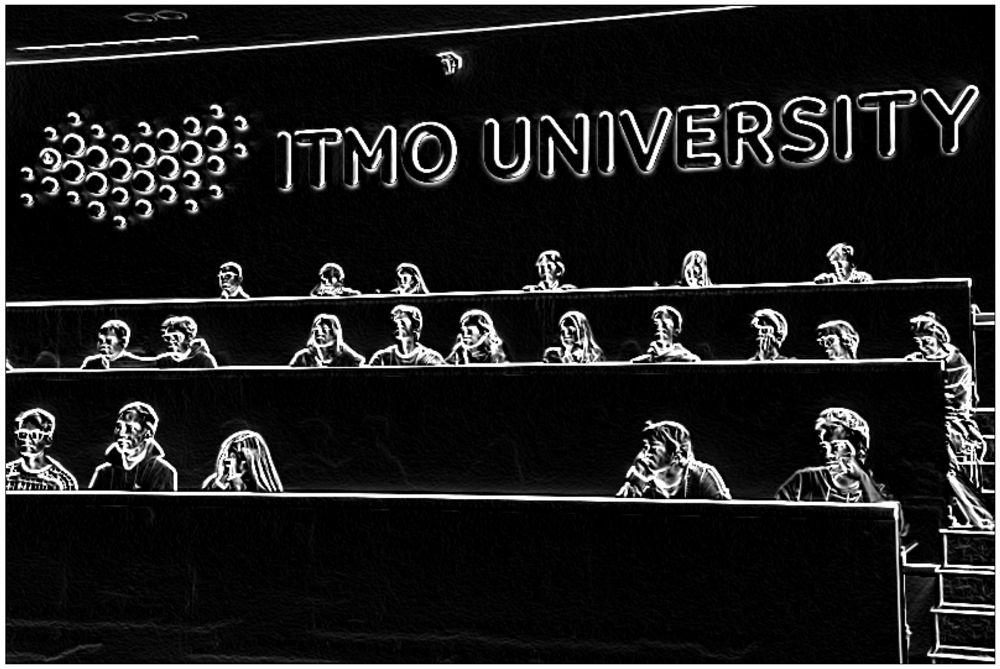

In [10]:
# Оператор Собела
kernel_Sobel_x = np.array([
    [-1, 0, 1],
    [-2, 0, 2],
    [-1, 0, 1]])
kernel_Sobel_y = np.array([
    [1, 2, 1],
    [0, 0, 0],
    [-1, -2, -1]])
kernel_Ku = 2.0

image_filtered = kernel_Ku * np.sqrt(
    np.power(cv2.filter2D(image, -1, kernel_Sobel_x), 2.0) + \
    np.power(cv2.filter2D(image, -1, kernel_Sobel_y), 2.0)
)
image_filtered = np.clip(np.round(image_filtered), 0, 255).astype(dtype=np.uint8)

figure(figsize=(32, 16), dpi=80)
plt.imshow(cv2.cvtColor(image_filtered, cv2.COLOR_GRAY2RGB))
plt.xticks([]),plt.yticks([])
plt.show()

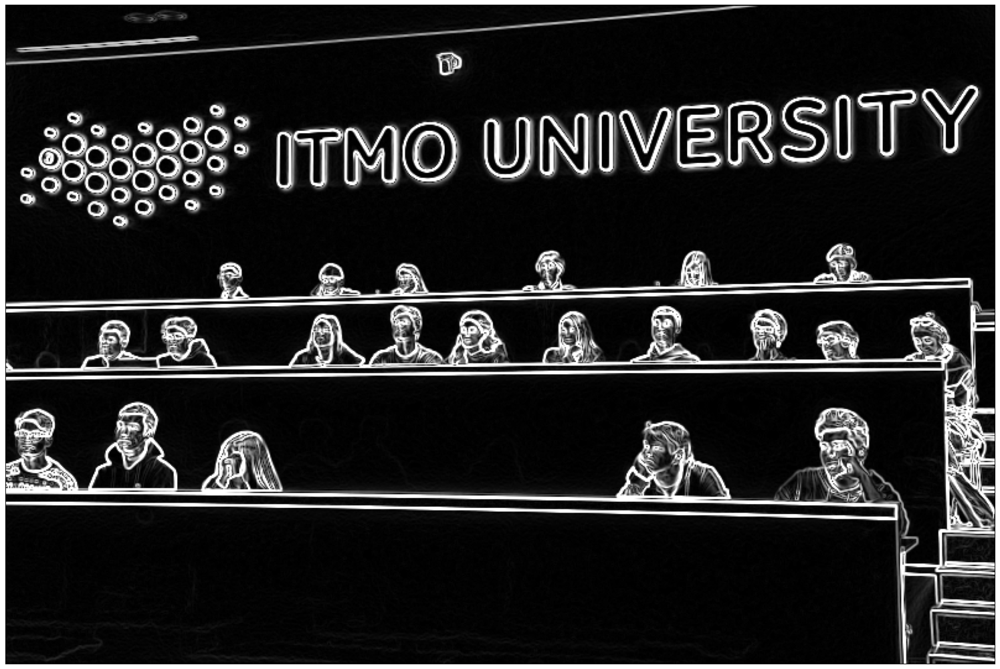

In [11]:
# Оператор Собела двунаправленный
kernel_Sobel_x = np.array([
    [-1, 0, 1],
    [-2, 0, 2],
    [-1, 0, 1]])
kernel_Sobel_y = np.array([
    [1, 2, 1],
    [0, 0, 0],
    [-1, -2, -1]])
kernel_Ku = 1.0

image_filtered = kernel_Ku * np.sqrt(
    np.power(cv2.filter2D(image, -1, kernel_Sobel_x), 2.0) + \
    np.power(cv2.filter2D(image, -1, kernel_Sobel_y), 2.0) + \
    np.power(cv2.filter2D(image, -1, -kernel_Sobel_x), 2.0) + \
    np.power(cv2.filter2D(image, -1, -kernel_Sobel_y), 2.0)
)
image_filtered = np.clip(np.round(image_filtered), 0, 255).astype(dtype=np.uint8)

figure(figsize=(32, 16), dpi=80)
plt.imshow(cv2.cvtColor(image_filtered, cv2.COLOR_GRAY2RGB))
plt.xticks([]),plt.yticks([])
plt.show()

### 4.4 Фильтр Лапласа

In [12]:
# Оператор Лапласа 1 порядка
kernel_Laplacian_1 = np.array([
    [0, 1, 0],
    [1, -4, 1],
    [0, 1, 0]])
kernel_Ku = 8.0

image_filtered = kernel_Ku * cv2.filter2D(image, -1, kernel_Laplacian_1)
image_filtered = np.clip(np.round(image_filtered), 0, 255).astype(dtype=np.uint8)

figure(figsize=(32, 16), dpi=80)
plt.imshow(cv2.cvtColor(image_filtered, cv2.COLOR_GRAY2RGB))
plt.xticks([]),plt.yticks([])
plt.show()

Output hidden; open in https://colab.research.google.com to view.

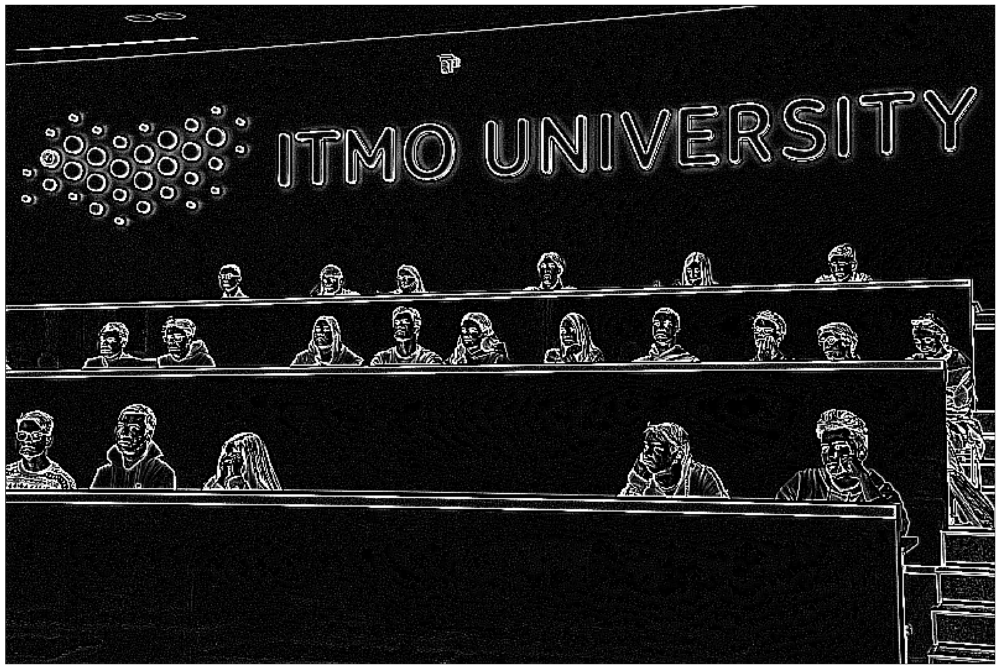

In [13]:
# Оператор Лапласа 2 порядка
kernel_Laplacian_2 = np.array([
    [1, 1, 1],
    [1, -8, 1],
    [1, 1, 1]])
kernel_Ku = 4.0

image_filtered = kernel_Ku * cv2.filter2D(image, -1, kernel_Laplacian_2)
image_filtered = np.clip(np.round(image_filtered), 0, 255).astype(dtype=np.uint8)

figure(figsize=(32, 16), dpi=80)
plt.imshow(cv2.cvtColor(image_filtered, cv2.COLOR_GRAY2RGB))
plt.xticks([]),plt.yticks([])
plt.show()

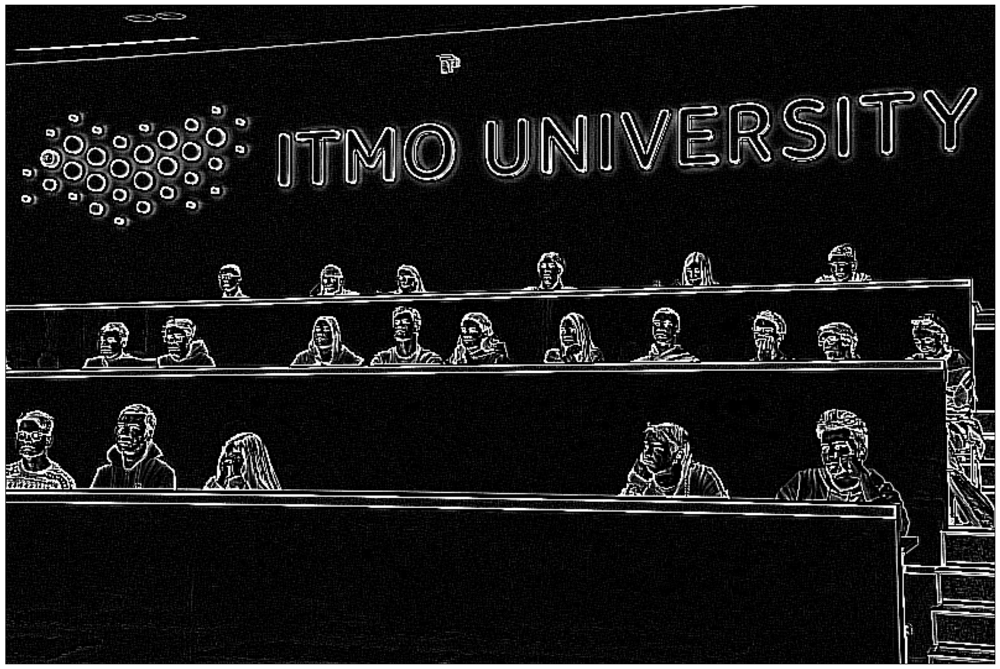

In [14]:
# Оператор Лапласа 3 порядка
kernel_Laplacian_3 = np.array([
    [2, -1, 2],
    [-1, -4, -1],
    [2, -1, 2]])
kernel_Ku = 4.0

image_filtered = kernel_Ku * cv2.filter2D(image, -1, kernel_Laplacian_3)
image_filtered = np.clip(np.round(image_filtered), 0, 255).astype(dtype=np.uint8)

figure(figsize=(32, 16), dpi=80)
plt.imshow(cv2.cvtColor(image_filtered, cv2.COLOR_GRAY2RGB))
plt.xticks([]),plt.yticks([])
plt.show()

In [15]:
# Оператор Лапласа 4 порядка
kernel_Laplacian_4 = np.array([
    [-1, 2, -1],
    [2, -4, 2],
    [-1, 2, -1]])
kernel_Ku = 8.0

image_filtered = kernel_Ku * cv2.filter2D(image, -1, kernel_Laplacian_4)
image_filtered = np.clip(np.round(image_filtered), 0, 255).astype(dtype=np.uint8)

figure(figsize=(32, 16), dpi=80)
plt.imshow(cv2.cvtColor(image_filtered, cv2.COLOR_GRAY2RGB))
plt.xticks([]),plt.yticks([])
plt.show()

Output hidden; open in https://colab.research.google.com to view.

### 4.5 Фильтр Кенни

threshold1 = 10.0, threshold2 = 20.0


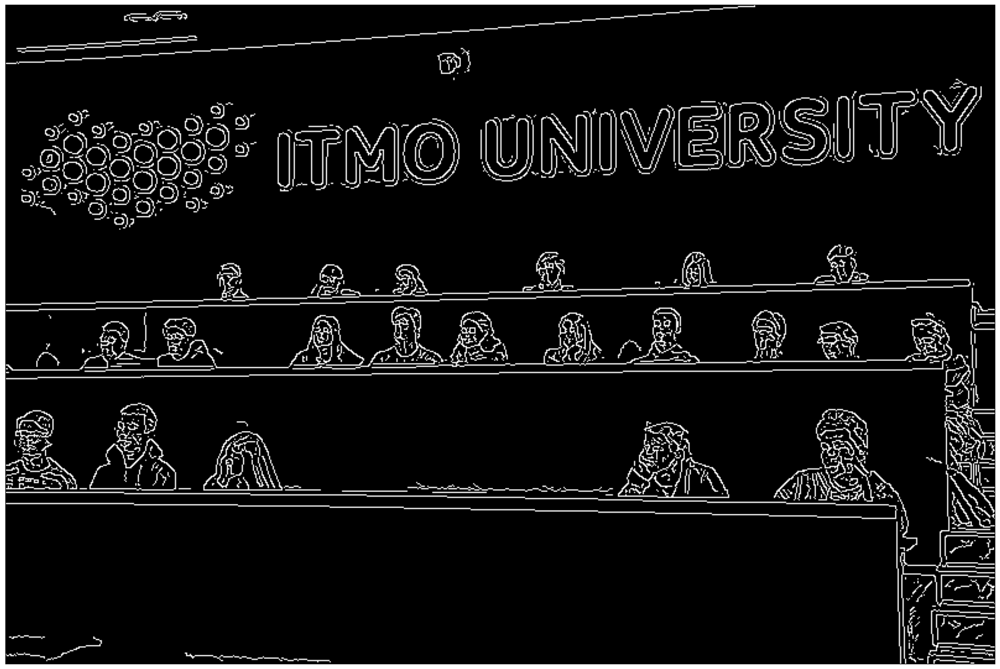

In [16]:
image = cv2.GaussianBlur(image, (5, 5), 0)

threshold1 = 10.0
threshold2 = 20.0
print(f"threshold1 = {threshold1}, threshold2 = {threshold2}")

figure(figsize=(32, 16), dpi=80)
plt.imshow(cv2.cvtColor(cv2.Canny(image, threshold1, threshold2), cv2.COLOR_GRAY2RGB))
plt.xticks([]),plt.yticks([])
plt.show()

threshold1 = 30.0, threshold2 = 70.0


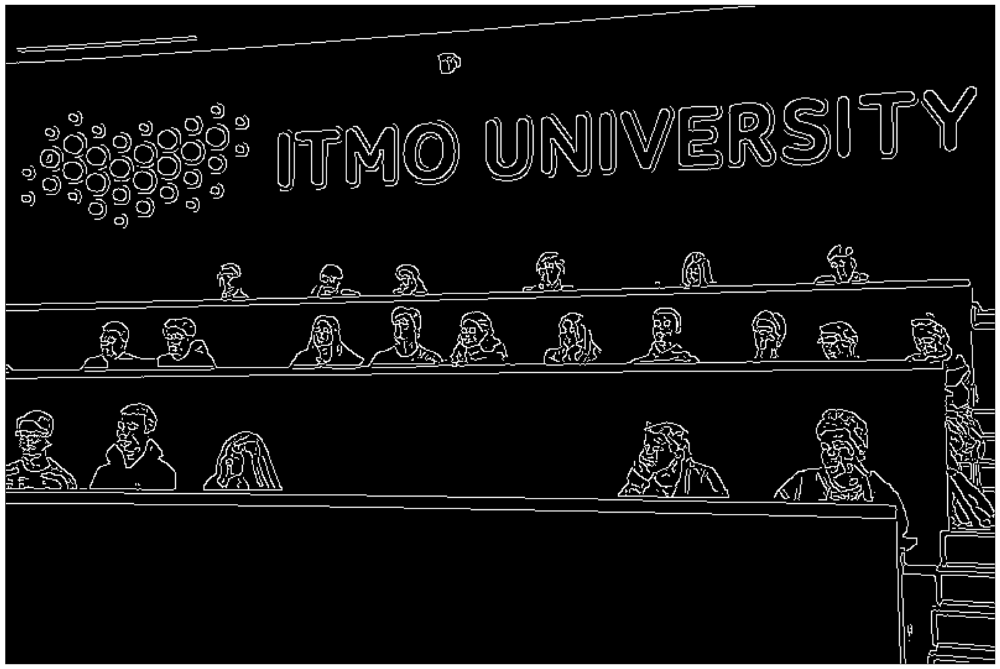

In [17]:
threshold1 = 30.0
threshold2 = 70.0
print(f"threshold1 = {threshold1}, threshold2 = {threshold2}")

figure(figsize=(32, 16), dpi=80)
plt.imshow(cv2.cvtColor(cv2.Canny(image, threshold1, threshold2), cv2.COLOR_GRAY2RGB))
plt.xticks([]),plt.yticks([])
plt.show()

threshold1 = 100.0, threshold2 = 200.0


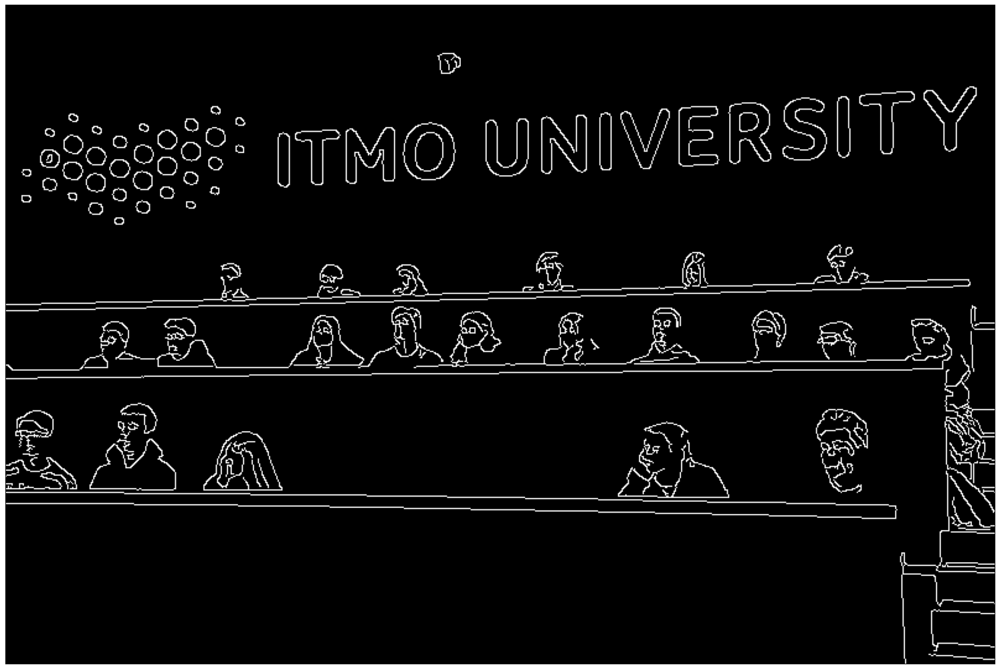

In [18]:
threshold1 = 100.0
threshold2 = 200.0
print(f"threshold1 = {threshold1}, threshold2 = {threshold2}")

figure(figsize=(32, 16), dpi=80)
plt.imshow(cv2.cvtColor(cv2.Canny(image, threshold1, threshold2), cv2.COLOR_GRAY2RGB))
plt.xticks([]),plt.yticks([])
plt.show()

threshold1 = 200.0, threshold2 = 300.0


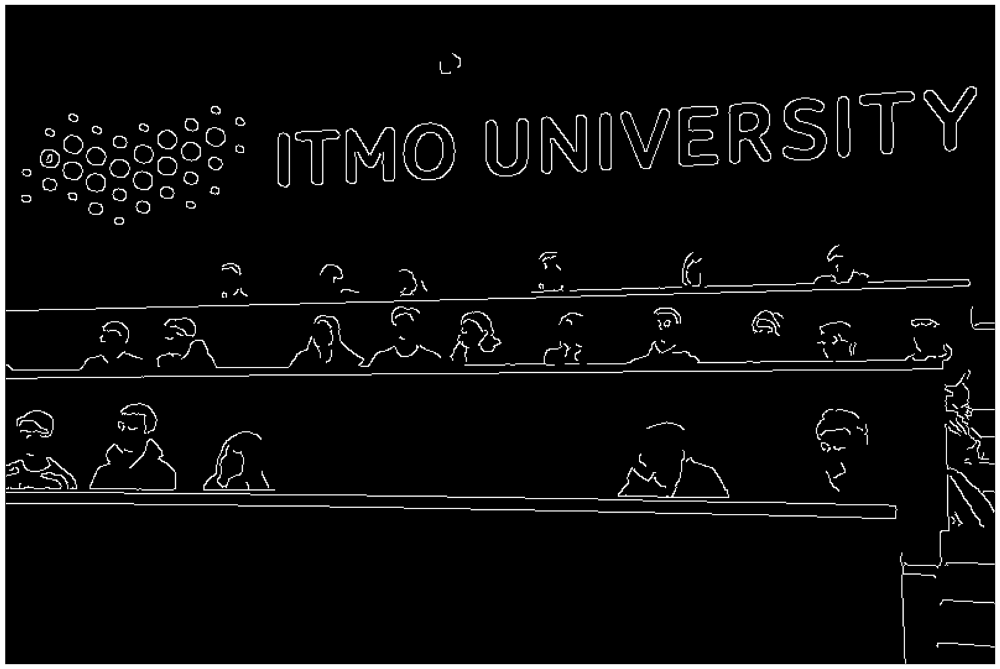

In [19]:
threshold1 = 200.0
threshold2 = 300.0
print(f"threshold1 = {threshold1}, threshold2 = {threshold2}")

figure(figsize=(32, 16), dpi=80)
plt.imshow(cv2.cvtColor(cv2.Canny(image, threshold1, threshold2), cv2.COLOR_GRAY2RGB))
plt.xticks([]),plt.yticks([])
plt.show()

threshold1 = 30.0, threshold2 = 100.0


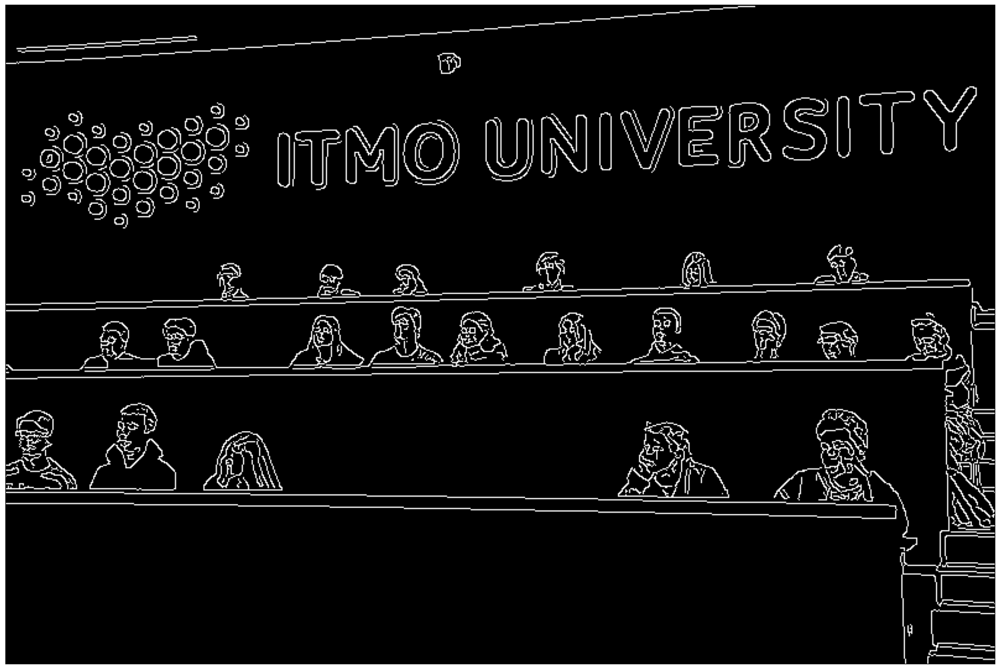

In [20]:
threshold1 = 30.0
threshold2 = 100.0
print(f"threshold1 = {threshold1}, threshold2 = {threshold2}")

figure(figsize=(32, 16), dpi=80)
plt.imshow(cv2.cvtColor(cv2.Canny(image, threshold1, threshold2), cv2.COLOR_GRAY2RGB))
plt.xticks([]),plt.yticks([])
plt.show()

threshold1 = 100.0, threshold2 = 30.0


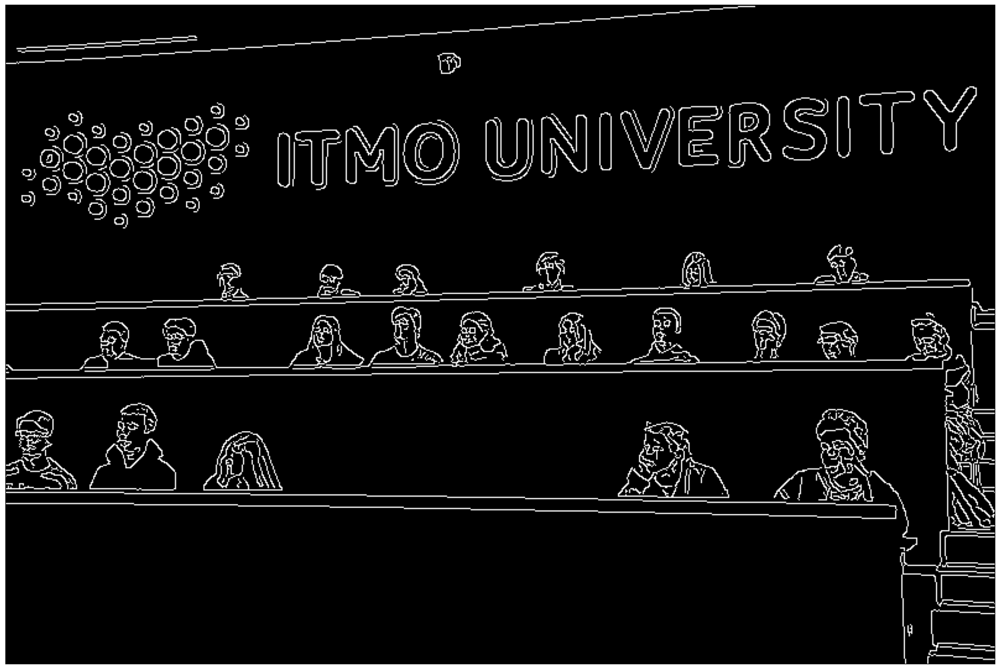

In [21]:
threshold1 = 100.0
threshold2 = 30.0
print(f"threshold1 = {threshold1}, threshold2 = {threshold2}")

figure(figsize=(32, 16), dpi=80)
plt.imshow(cv2.cvtColor(cv2.Canny(image, threshold1, threshold2), cv2.COLOR_GRAY2RGB))
plt.xticks([]),plt.yticks([])
plt.show()